# Preâmbulo

Imports, funções, downloads e instalação do Pytorch.

In [1]:
# Downloading the JSRT dataset.
# !rm -r ./*
!mkdir -p jsrt
!wget https://www.dropbox.com/sh/grjpx4oeacg32c0/AAAPpBgABESAWz-se4eCP9-Ya -O jsrt.zip
!unzip -q jsrt.zip -d jsrt
!ls jsrt

/bin/bash: line 1: wget: command not found
/bin/bash: line 1: unzip: command not found
clavicles_test.txt   ground_truths   heart_train.txt  lungs_test.txt
clavicles_train.txt  heart_test.txt  images	      lungs_train.txt


In [2]:
# Basic imports.
import os
import time
import numpy as np

import torch
import torch.nn.functional as F
from torch import nn
from torch import optim
from torch.utils.data import DataLoader
from torch.utils import data
from torch.backends import cudnn

from torchvision import models

from skimage import io
from skimage import transform

from sklearn import metrics

from matplotlib import pyplot as plt

%matplotlib inline

cudnn.benchmark = True

In [3]:
# Setting predefined arguments.
args = {
    'epoch_num': 50,      # Number of epochs.
    'dataset': 'jsrt',    # Dataset.
    'task': 'lungs',      # Task.
    # 'task': 'heart',      # Task.
    # 'task': 'clavicles',  # Task.
    'n_classes': 2,       # Number of classes in segmentation task.
    'network': 'unet',    # Network architecture.
    'lr': 1e-4,           # Learning rate.
    'weight_decay': 5e-4, # L2 penalty.
    'momentum': 0.9,      # Momentum.
    'num_workers': 2,     # Number of workers on data loader.
    'batch_size': 10,      # Mini-batch size.
    # 'batch_size': 8,      # Mini-batch size.
    'w_size': 256,        # Width size for image resizing.
    'h_size': 256,        # Height size for image resizing.
    'show_freq': 5,       # Frequency for showing predictions.
}

if torch.cuda.is_available():
    args['device'] = torch.device('cuda')
else:
    args['device'] = torch.device('cpu')

print(args['device'])

cuda


In [4]:
# Random initialization for weights and biases.
def initialize_weights(*models):
    for model in models:
        for module in model.modules():
            if isinstance(module, nn.Conv2d) or isinstance(module, nn.Linear):
                nn.init.kaiming_normal_(module.weight)
                if module.bias is not None:
                    module.bias.data.zero_()
            elif isinstance(module, nn.BatchNorm2d):
                module.weight.data.fill_(1)
                module.bias.data.zero_()

In [5]:
def evaluate(prds, labs, num_classes):

    iou_list = []
    f1_list = []

    for prd, lab in zip(prds, labs):

        iou = metrics.jaccard_score(lab.ravel(), prd.ravel())
        f1 = metrics.f1_score(lab.ravel(), prd.ravel())

        iou_list.append(iou)
        f1_list.append(f1)

    iou_list = np.asarray(iou_list)
    f1_list = np.asarray(f1_list)

    return iou_list, f1_list

# Dataloaders Customizados

Os frameworks de Deep Learning modernos (i.e. MXNet e Pytorch) permitem a criação de dataloaders customizados ao se sobrescreverem classes desses frameworks. Esse tipo de dataloader é especialmente útil no caso de tarefas diferentes das de classificação que temos visto até agora (i.e. segmentação e detecção de imagens, processamento de áudio, processamento de linguagem, natural, etc), nas quais os labels podem ser mais esparsos ou densos que rótulos de classificação.

Usando como base as classes [*Dataloader*](https://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) e [*Dataset*](https://pytorch.org/docs/stable/data.html#torch.utils.data.Dataset) do subpacote [*data*](https://pytorch.org/docs/stable/data.html) do Pytorch, podemos customizar a leitura dos dados ao mesmo tempo em que paralelizamos a leitura das amostras dos nossos batches. A paralelização da leitura de amostras em várias [threads](https://www.tutorialspoint.com/python/python_multithreading) torna o uso da GPU o mais eficiente possível, já que não é necessário deixar a GPU esperando pelo carregamento de novas amostras para compor um batch.

In [6]:
# Class that reads a sequence of image paths from a text file and creates a data.Dataset with them.
class ListDataset(data.Dataset):

    def __init__(self, root, mode, dataset, task, resize_to=(256, 256), in_channels=1, num_classes=2):

        # Initializing variables.
        self.root = root
        self.mode = mode
        self.dataset = dataset
        self.task = task
        self.resize_to = resize_to
        self.in_channels = in_channels
        self.num_classes = num_classes

        # Creating list of image files.
        self.imgs = self.make_dataset()

        # Check for consistency in list.
        if len(self.imgs) == 0:

            raise (RuntimeError('Found 0 images, please check the data set'))

    def make_dataset(self):

        # Making sure the mode is correct.
        assert self.mode in ['train', 'test']

        # Joining input paths.
        self.img_path = os.path.join(self.root,
                                     self.dataset,
                                     'images')
        self.msk_path = os.path.join(self.root,
                                     self.dataset,
                                     'ground_truths',
                                     self.task)

        # Reading paths from file.
        items = [l.strip('\n') for l in open(os.path.join(self.root,
                                                          self.dataset,
                                                          self.task + '_' + self.mode + '.txt')).readlines()]

        # Returning list.
        return items

    def __getitem__(self, index):

        # Reading items from list and mounting .
        f = self.imgs[index]

        img_path = os.path.join(self.img_path, f)
        msk_path = os.path.join(self.msk_path, f)

        # Reading images.
        img = io.imread(img_path)
        msk = io.imread(msk_path)

        # Resising images.
        img = transform.resize(img, self.resize_to,
                               preserve_range=True, order=1)
        msk = transform.resize(msk, self.resize_to,
                               preserve_range=True, order=0)

        # Casting images to the appropriate dtypes.
        img = img.astype(np.float32)
        msk = msk.astype(np.int64)

        if self.num_classes == 2:
            msk[msk > 0] = 1

        # Normalization (z-score).
        if self.in_channels == 1:
            img = (img - img.mean()) / img.std()
        else:
            for i in range(img.shape[2]):
                img[:,:,i] = (img[:,:,i] - img[:,:,i].mean()) / img[:,:,i].std()

        # Fixing channel dimension.
        if self.in_channels == 1:

            # If number of input channels is 1, simply add a new dimension.
            img = np.expand_dims(img, axis=0) # From (H, W) to (C=1, H, W).

        else:

            # Else, transpose array.
            img = np.transpose(img, (2, 0, 1)) # From (H, W, C) to (C, H, W).

        # Turning numpy arrays to tensors.
        img = torch.from_numpy(img)
        msk = torch.from_numpy(msk)

        # Returning to iterator.
        return img, msk

    def __len__(self):

        return len(self.imgs)

# Instantiating dataloaders.
root = '/homeLocal/mpintodasilva/'

# Setting datasets.
train_set = ListDataset(root,
                        'train',
                        args['dataset'],
                        args['task'],
                        (args['h_size'], args['w_size']))
test_set = ListDataset(root,
                       'test',
                       args['dataset'],
                       args['task'],
                       (args['h_size'], args['w_size']))

# Setting dataloaders.
train_loader = DataLoader(train_set,
                          batch_size=args['batch_size'],
                          num_workers=args['num_workers'],
                          shuffle=True)
test_loader = DataLoader(test_set,
                         batch_size=1,
                         num_workers=args['num_workers'],
                         shuffle=False)

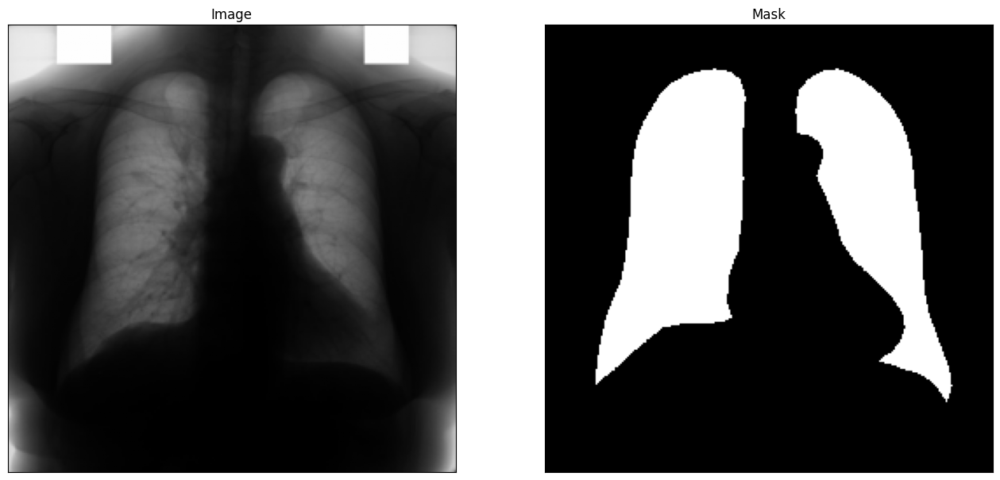

In [7]:
for i, batch_data in enumerate(train_loader):

    img, lab = batch_data

    fig, ax = plt.subplots(1, 2, figsize=(16, 8))

    ax[0].imshow(img[0, 0].numpy(), cmap=plt.get_cmap('gray'))
    ax[0].set_yticks([])
    ax[0].set_xticks([])
    ax[0].set_title('Image')

    ax[1].imshow(lab[0].numpy(), cmap=plt.get_cmap('gray'))
    ax[1].set_yticks([])
    ax[1].set_xticks([])
    ax[1].set_title('Mask')

    plt.show()

    break

# Arquiteturas Encoder-Decoder

FCNs foram as primeiras redes neurais profundas para Segmentação Semântica, porém o uso de interpolações bilineares para alimentar as camadas convolucionais finais da rede pode tornar a segmentação pouco sensível a detalhes pequenos nas imagens de entrada, mesmo com o uso de **Skip Connections**. Entre 2015 e 2017 foram propostas as primeiras arquiteturas **Encoder-Decoder** para Segmentação Semântica que, ao invés de realizarem interpolações para recuperar a resolução espacial dos feature maps, usam **Convoluções Transpostas** com filtros treináveis. Isso torna o processo de upsampling dos feature maps de baixa resolução mais fidedigno a detalhes nas imagens de entrada.

![**Convolução**](http://deeplearning.net/software/theano_versions/dev/_images/no_padding_no_strides.gif)![**Convolução Transposta**](http://deeplearning.net/software/theano_versions/dev/_images/no_padding_no_strides_transposed.gif)

As regiões com os feature maps de menor resolução espacial em arquiteturas Encoder-Decoder são chamadas de bottlenecks dessas redes e as camadas de **Convolução** e **Convolução Transposta** dos dois lados do bottleneck de uma rede são muito frequentemente simétricas, como pode ser visto na imagem abaixo.

![Encoder-Decoder](https://www.dropbox.com/s/kd40qyqmusweovu/Unet.png?dl=1)

Duas arquiteturas Encoder-Decoder para segmentação se destacam na literatural atual: as [**U-Nets**](https://arxiv.org/pdf/1505.04597.pdf) e as [**SegNets**](https://arxiv.org/pdf/1511.00561.pdf), possuindo desempenho similar na maioria das aplicações. U-Nets seguem a filosofia da [**VGG**](https://arxiv.org/abs/1409.1556) com convoluções 3x3 e padding de tamanho 1 com a resolução espacial dos feature maps sendo controlada por Max Poolings entre os blocos convolucionais. As camadas do Decoder das U-Nets recebem os feature maps computados pelas suas camadas simétricas no Encoder concatenados à saída da camada anterior. Essa operação é análoga às Skip Connections das FCNs, porém feitas para cada par de camadas simétricas (ou seja, que geram filtros com as mesmas resoluções espaciais). Isso faz com que os decoders das U-Nets possuam consideravelmente mais filtros que os Encoders, como também pode ser visto no esquema abaixo.

![U-Nets](https://www.dropbox.com/s/woistektygmv693/unets.png?dl=1)

Assim como nas FCNs, as U-Nets implementam os Skip Connections com concanteções no eixo dos canais, como mostrado na imagem a seguir.

![Skip U-Nets](https://www.dropbox.com/s/ao9878yf2ke5ce1/Nets_UNet_Petro.png?dl=1)

Enquanto U-Nets concatenam os feature maps de saída das camadas do Encoder como inputs para as camadas do Decoder, as SegNets se aproveitam dos índices das operações de Max Pooling 2D do Encoder para computar o Decoder. A diferença mais marcante entre as U-Nets e as SegNets se dá na forma como as resoluções de entrada são restauradas após o bottleneck, ou seja, no Decoder.

![SegNets](https://www.dropbox.com/s/4605yaowoxuqbfu/segnets.png?dl=1)

Os índices dos Max Poolings das camadas do Encoder são utilizados para gerar feature maps esparsos no Decoder, os quais são passados para **Convoluções Transpostas** para realizar o upsampling.

![Max Pooling Indices](https://www.dropbox.com/s/ub8y5t27u1ucdwd/pool_indices.png?dl=1)

# Demo: Implementando U-Net

1.   Implementar as classes *EncoderBlock* e *DecoderBlock*. Ambas *\_\_init\_\_()* e *forward()* devem ser complementadas para as classes.
2.   Usar as classes *EncoderBlock* e *DecoderBlock* na classe *U-Net*.
3.   Instanciar um otimizador e uma loss.
4.   Complementar trechos TO DO nas funções *train()* e *test()*.

PS.: Todas as convoluções de uma U-Net são 3x3 com padding igual a 1, menos a última que tem kernel 1x1 para realizar a predição densa para cada pixels de acordo com o número de classes.

In [8]:
class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):

        super().__init__()

        if not mid_channels:
            mid_channels = out_channels

        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):

        return self.double_conv(x)

class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):

        super().__init__()

        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):

        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        # if you have padding issues, see
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class UNet(nn.Module):

    def __init__(self, n_channels, n_classes):

        super(UNet, self).__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes

        self.inc = DoubleConv(n_channels, 64)

        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        self.down4 = Down(512, 1024)

        self.up1 = Up(1024, 512)
        self.up2 = Up(512, 256)
        self.up3 = Up(256, 128)
        self.up4 = Up(128, 128)

        self.out_channels = 64

        self.outc = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, n_classes, kernel_size=3, padding=1),
        )

    def forward(self, x, return_feats=False):

        x1 = self.inc(x)

        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)

        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)

        logits = self.outc(x)

        return logits

# Challenge: Implementando FCN com backbone da ResNet

1.   Escolher uma ResNet (das menores, ou seja, ResNet-18 ou ResNet-34) e implementar uma FCN com o backbone dela e com Skip Connections.
2.   Comparar os resultados da U-Net, SegNet e FCN com backbone da ResNet nas tasks 'lung', 'heart' e, principalmente, 'clavicles'. Essas tasks podem ser definidas no parâmetro 'task' do dicionário *args*. A tarefa de segmentação de clavículas é dentre todas a mais difícil devido ao grande desbalanceamento entre classes.

In [9]:
class FCN_ResNet50(nn.Module):

    def __init__(self, input_channels, num_classes):

        super(FCN_ResNet50, self).__init__()

        feat = models.resnet34(weights=None, progress=False)

        self.backbone1 = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False),
            feat.bn1,
            feat.relu,
            feat.maxpool,
            feat.layer1,
            feat.layer2,
            feat.layer3,
        )
        self.backbone2 = nn.Sequential(
            feat.layer4
        )

        self.classifier = nn.Sequential(
            nn.Conv2d(256 + 512, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, num_classes, kernel_size=3, padding=1)
        )

        initialize_weights(self)

    def forward(self, x):

        feat1 = self.backbone1(x)
        feat2 = self.backbone2(feat1)

        feat = torch.cat([F.interpolate(feat1, x.size()[2:], mode='bilinear'),
                          F.interpolate(feat2, x.size()[2:], mode='bilinear')], 1)
        # feat = torch.cat([F.upsample(feat1, x.size()[2:], mode='bilinear'),
        #                   F.upsample(feat2, x.size()[2:], mode='bilinear')], 1)

        output = self.classifier(feat)

        return output

In [10]:
class SwinTransformerSegmentation(nn.Module):
    """
    SwinTransformer-based segmentation model using torchvision's SwinTransformer
    """
    
    def __init__(self, input_channels, num_classes, pretrained=True):
        super(SwinTransformerSegmentation, self).__init__()
        
        # Import SwinTransformer from torchvision
        from torchvision.models import swin_t, Swin_T_Weights
        
        # Load pretrained SwinTransformer (Tiny version for efficiency)
        if pretrained:
            self.backbone = swin_t(weights=Swin_T_Weights.IMAGENET1K_V1)
        else:
            self.backbone = swin_t(weights=None)
        
        # Modify first layer to accept input_channels (if different from 3)
        if input_channels != 3:
            # Get the original first convolution layer
            original_conv = self.backbone.features[0][0]
            # Create new convolution layer with desired input channels
            self.backbone.features[0][0] = nn.Conv2d(
                input_channels, 
                original_conv.out_channels,
                kernel_size=original_conv.kernel_size,
                stride=original_conv.stride,
                padding=original_conv.padding,
                bias=original_conv.bias is not None
            )
            
        # Remove the classifier head (we'll use it for feature extraction only)
        self.backbone.head = nn.Identity()
        self.backbone.avgpool = nn.Identity()
        self.backbone.flatten = nn.Identity()
        
        # Get feature dimensions from backbone
        # SwinTransformer Tiny has 768 features in the final layer
        backbone_features = 768
        
        # Decoder layers for upsampling
        self.decoder = nn.Sequential(
            # Upsample from 8x8 (typical SwinTransformer output) to full resolution
            nn.ConvTranspose2d(backbone_features, 512, kernel_size=4, stride=4, padding=0),  # 8x -> 32x
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),  # 32x -> 64x
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # 64x -> 128x
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),   # 128x -> 256x
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            
            # Final classification layer
            nn.Conv2d(64, num_classes, kernel_size=3, padding=1)
        )
        
        # Initialize decoder weights
        initialize_weights(self.decoder)
    
    def forward(self, x):
        input_size = x.size()[2:]
    
        # Extract features
        features = self.backbone(x)  # [B, C, H, W]
    
        # Pass through decoder
        output = self.decoder(features)
    
        # Upsample to match input
        if output.size()[2:] != input_size:
            output = F.interpolate(output, size=input_size, mode='bilinear', align_corners=False)
    
        return output

In [11]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import swin_t, Swin_T_Weights

def initialize_weights(module):
    if isinstance(module, nn.Conv2d) or isinstance(module, nn.ConvTranspose2d):
        nn.init.kaiming_normal_(module.weight, mode='fan_out', nonlinearity='relu')
        if module.bias is not None:
            nn.init.constant_(module.bias, 0)
    elif isinstance(module, nn.BatchNorm2d):
        nn.init.constant_(module.weight, 1)
        nn.init.constant_(module.bias, 0)

class SwinTransformerSegmentationSkip(nn.Module):
    def __init__(self, input_channels, num_classes, pretrained=True):
        super(SwinTransformerSegmentationSkip, self).__init__()

        # Load pretrained backbone
        if pretrained:
            self.backbone = swin_t(weights=Swin_T_Weights.IMAGENET1K_V1)
        else:
            self.backbone = swin_t(weights=None)

        # Ajustar canal de entrada
        if input_channels != 3:
            original_conv = self.backbone.features[0][0]
            self.backbone.features[0][0] = nn.Conv2d(
                input_channels,
                original_conv.out_channels,
                kernel_size=original_conv.kernel_size,
                stride=original_conv.stride,
                padding=original_conv.padding,
                bias=original_conv.bias is not None
            )

        # Remover cabeça do Swin
        self.backbone.head = nn.Identity()
        self.backbone.avgpool = nn.Identity()
        self.backbone.flatten = nn.Identity()

        # Extração dos canais de cada estágio
        self.encoder_channels = [96, 192, 384, 768]

        # Decoder com skip connections estilo U-Net
        self.decoder4 = self._decoder_block(self.encoder_channels[3], self.encoder_channels[2])
        self.decoder3 = self._decoder_block(self.encoder_channels[2], self.encoder_channels[1])
        self.decoder2 = self._decoder_block(self.encoder_channels[1], self.encoder_channels[0])
        self.decoder1 = self._decoder_block(self.encoder_channels[0], 64)

        # Camada final
        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=3, padding=1)

        self.apply(initialize_weights)

    def _decoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        input_size = x.size()[2:]
    
        features = []
        out = x
    
        # Stage 1
        out = self.backbone.features[0](out)
        out = out.permute(0, 3, 1, 2)  # B,C,H,W
        features.append(out)  # 1/4
    
        # Stage 2
        out = self.backbone.features[1](out.permute(0, 2, 3, 1))  # voltar para B,H,W,C
        out = self.backbone.features[2](out)
        out = out.permute(0, 3, 1, 2)
        features.append(out)  # 1/8
    
        # Stage 3
        out = self.backbone.features[3](out.permute(0, 2, 3, 1))
        out = self.backbone.features[4](out)
        out = out.permute(0, 3, 1, 2)
        features.append(out)  # 1/16
    
        # Stage 4
        out = self.backbone.features[5](out.permute(0, 2, 3, 1))
        out = self.backbone.features[6](out)
        out = self.backbone.features[7](out)
        out = out.permute(0, 3, 1, 2)
        features.append(out)  # 1/32
    
        # Decoder
        d4 = self.decoder4(features[3])                        # 1/16
        d3 = self.decoder3(d4 + features[2])                   # 1/8
        d2 = self.decoder2(d3 + features[1])                   # 1/4
        d1 = self.decoder1(d2 + features[0])                   # 1/2
    
        out = F.interpolate(d1, size=input_size, mode='bilinear', align_corners=False)
        out = self.final_conv(out)
        return out

In [12]:
# net = UNet(1, args['n_classes']).to(args['device'])
# net = FCN_ResNet50(1, args['n_classes']).to(args['device'])
# net = SwinTransformerSegmentation(1, args['n_classes']).to(args['device'])
net = SwinTransformerSegmentationSkip(1, args['n_classes']).to(args['device'])

In [13]:
# Setting optimizer.
optimizer = optim.Adam([p for p in list(net.parameters()) if p.requires_grad],
                       lr=args['lr'],
                       weight_decay=args['weight_decay'],
                       betas=(args['momentum'], 0.999))

In [14]:
criterion = nn.CrossEntropyLoss().to(args['device'])

In [25]:
# Training function.
def train(train_loader, net, criterion, optimizer, epoch):

    tic = time.time()

    # Setting network for training mode.
    net.train()

    # Average Meter for batch loss.
    train_loss = []

    # Lists for whole epoch loss.
    labs_all, prds_all = [], []

    # Iterating over batches.
    for i, batch_data in enumerate(train_loader):

        # Obtaining images and labels for batch.
        inps, labs = batch_data

        inps = inps.to(args['device'])
        labs = labs.to(args['device'])

        optimizer.zero_grad()

        outs = net(inps)

        loss = criterion(outs.view(outs.size(0), outs.size(1), -1),
                         labs.view(labs.size(0), -1))

        loss.backward()
        optimizer.step()

        # Obtaining predictions.
        prds = outs.data.max(1)[1].squeeze_(1).squeeze(0).cpu().numpy()

        # Appending images for epoch loss calculation.
        labs_all.append(labs.detach().data.squeeze(0).cpu().numpy())
        prds_all.append(prds)

        # Updating loss meter.
        train_loss.append(loss.data.item())

    toc = time.time()

    # Transforming list into numpy array.
    train_loss = np.asarray(train_loss)1
    # Computing error metrics for whole epoch.
    iou, f1 = evaluate(prds_all, labs_all, args['n_classes'])

    # Printing training epoch loss and metrics.
    print('-------------------------------------------------------------------')
    print('[epoch %d], [train loss %.4f +/- %.4f], [iou %.4f +/- %.4f], [f1 %.4f +/- %.4f], [time %.2f]' % (
        epoch, train_loss.mean(), train_loss.std(), iou.mean(), iou.std(), f1.mean(), f1.std(), (toc - tic)))
    print('-------------------------------------------------------------------')

def test(test_loader, net, criterion, epoch):

    tic = time.time()

    # Setting network for evaluation mode.
    net.eval()

    # Average Meter for batch loss.
    test_loss = []

    # Lists for whole epoch loss.
    labs_all, prds_all = [], []

    # Iterating over batches.
    for i, batch_data in enumerate(test_loader):

        # Obtaining images and labels for batch.
        inps, labs = batch_data

        inps = inps.to(args['device'])
        labs = labs.to(args['device'])

        outs = net(inps)

        loss = criterion(outs.view(outs.size(0), outs.size(1), -1),
                         labs.view(labs.size(0), -1))

        # Obtaining predictions.
        prds = outs.data.max(1)[1].squeeze_(1).squeeze(0).cpu().numpy()

        # Appending images for epoch loss calculation.
        labs_all.append(labs.detach().data.squeeze(0).cpu().numpy())
        prds_all.append(prds)

        # Updating loss meter.
        test_loss.append(loss.data.item())

       

        fig, ax = plt.subplots(1, 3, figsize=(9, 3))

        ax[0].imshow(inps.detach().cpu().numpy().squeeze())
        ax[0].set_yticks([])
        ax[0].set_xticks([])
        ax[0].set_title('Image')

        ax[1].imshow(labs.detach().data.squeeze(0).cpu().numpy().squeeze())
        ax[1].set_yticks([])
        ax[1].set_xticks([])
        ax[1].set_title('Label')

        ax[2].imshow(prds.squeeze())
        ax[2].set_yticks([])
        ax[2].set_xticks([])
        ax[2].set_title('Prediction')

        plt.show()

    toc = time.time()

    # Transforming list into numpy array.
    test_loss = np.asarray(test_loss)

    # Computing error metrics for whole epoch.
    iou, f1 = evaluate(prds_all, labs_all, args['n_classes'])

    # Printing test epoch loss and metrics.
    print('-------------------------------------------------------------------')
    print('[epoch %d], [test loss %.4f +/- %.4f], [iou %.4f +/- %.4f], [f1 %.4f +/- %.4f], [time %.2f]' % (
        epoch, test_loss.mean(), test_loss.std(), iou.mean(), iou.std(), f1.mean(), f1.std(), (toc - tic)))
    print('-------------------------------------------------------------------')

In [16]:
# net = UNet(1, args['n_classes']).to(args['device'])
# net = FCN_ResNet50(1, args['n_classes']).to(args['device'])
# net = SwinTransformerSegmentation(1, args['n_classes']).to(args['device'])
# net = SwinTransformerSegmentationSkip(1, args['n_classes']).to(args['device'])

# Iterating over epochs.
# for epoch in range(1, args['epoch_num'] + 1):
# 
#     # Training function.
#     train(train_loader, net, criterion, optimizer, epoch)
# 
#     # Computing test loss and metrics.
#     test(test_loader, net, criterion, epoch)

In [21]:
MODEL_MAP = {
    'unet': {
        'class': UNet,
        'weights': 'unet.pth',
    },
    'fcn_resnet': {
        'class': FCN_ResNet50,
        'weights': 'fcn_resnet.pth',
    },
    'swin': {
        'class': SwinTransformerSegmentation,
        'weights': 'swin.pth',
    },
    'swins': {
        'class': SwinTransformerSegmentationSkip,
        'weights': 'swins.pth',
    }
}

def get_model_and_load_weights(model_name, n_classes, device):
    if model_name not in MODEL_MAP:
        raise ValueError(f"Modelo '{model_name}' não reconhecido. Escolha entre: {list(MODEL_MAP.keys())}")

    model_class = MODEL_MAP[model_name]['class']
    weights_path = MODEL_MAP[model_name]['weights']

    model = torch.load(weights_path, map_location=device)
    model = model.to(device)
    
    return model

/tmp/ipykernel_162197/171110301.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(weights_path, map_location=device)


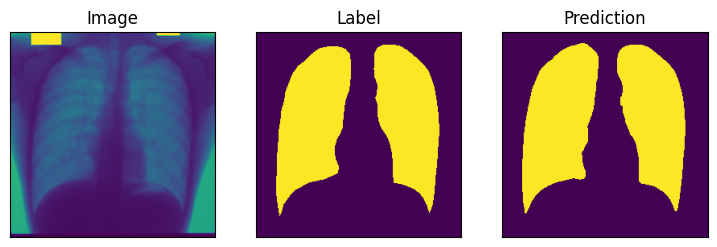

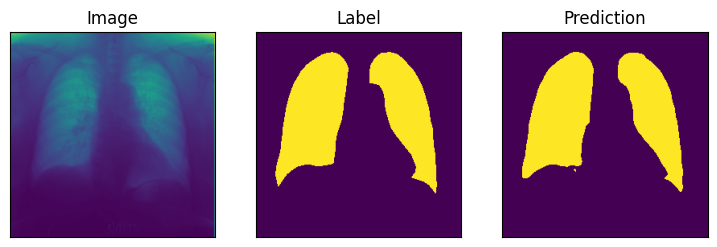

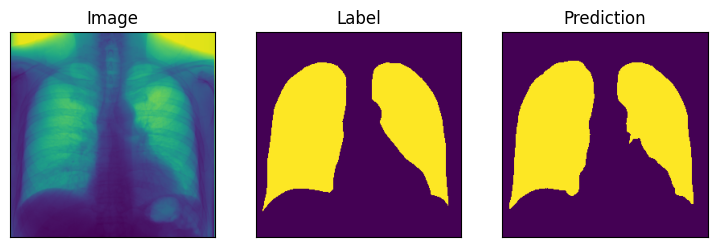

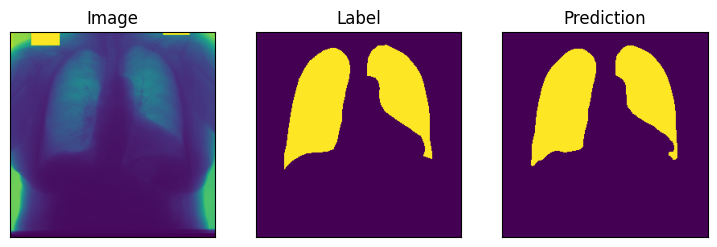

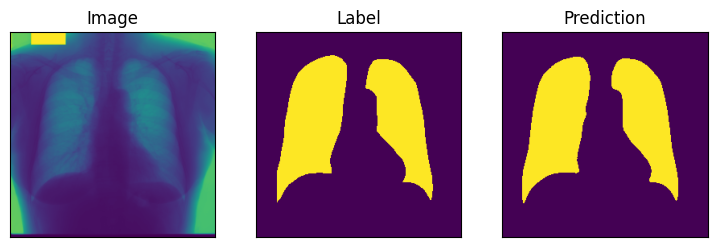

...

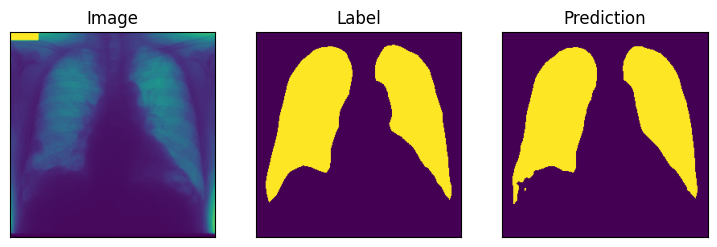

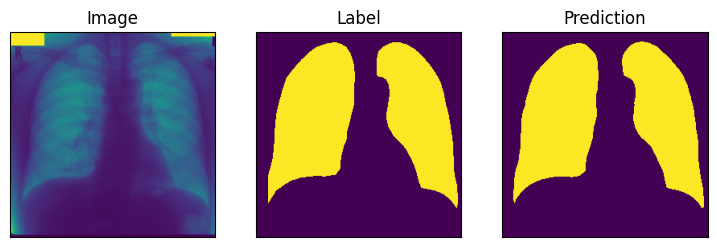

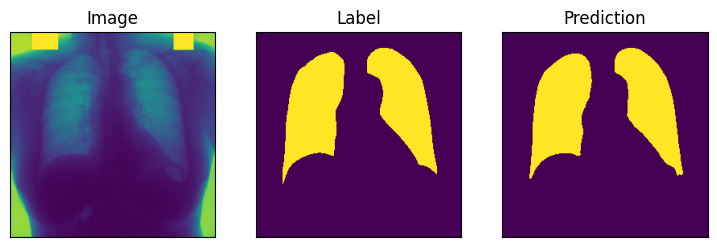

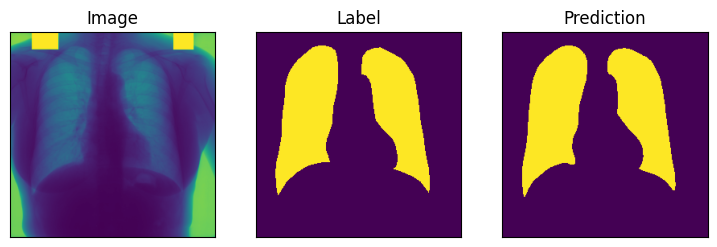

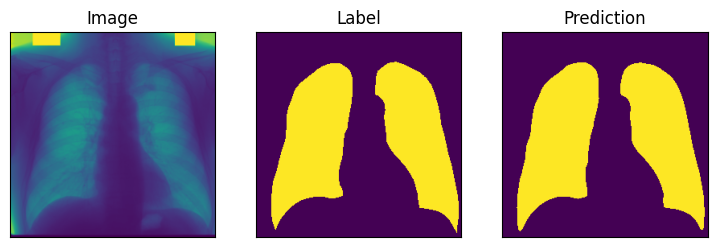

-------------------------------------------------------------------
[epoch 1], [test loss 0.0305 +/- 0.0097], [iou 0.9640 +/- 0.0087], [f1 0.9816 +/- 0.0045], [time 3.25]
-------------------------------------------------------------------


In [33]:
model_name = 'unet'  # pode ser 'unet', 'fcn_resnet', 'swin', 'swins'
net = get_model_and_load_weights(model_name, args['n_classes'], args['device'])
test(test_loader, net, criterion, 1)

/tmp/ipykernel_162197/171110301.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(weights_path, map_location=device)


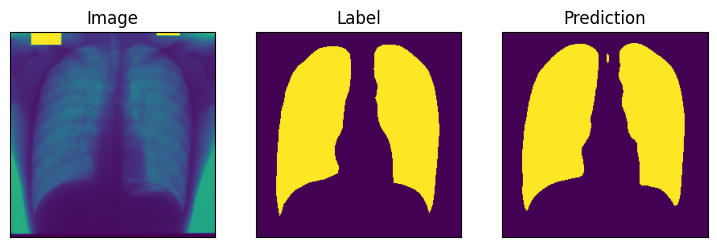

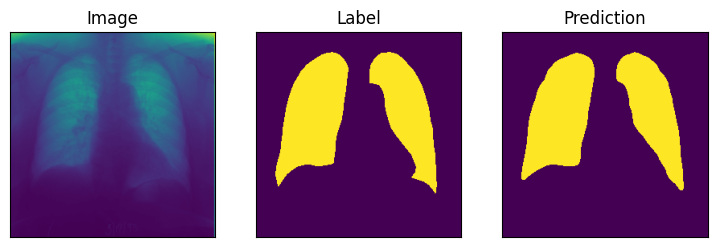

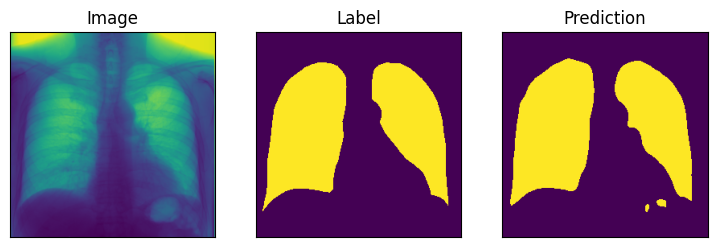

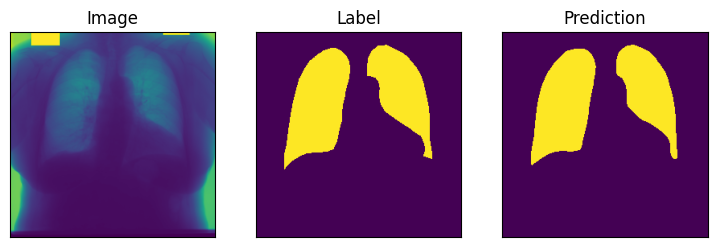

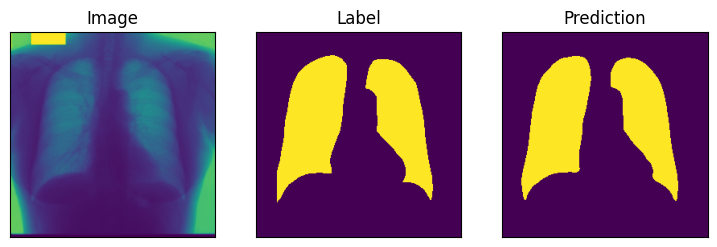

...

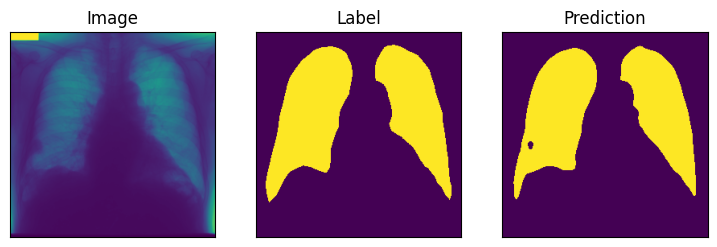

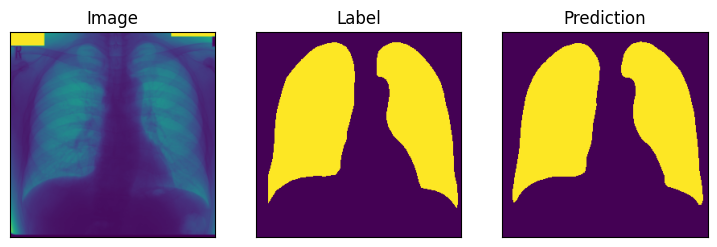

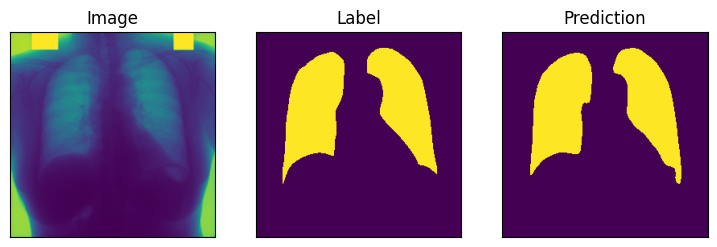

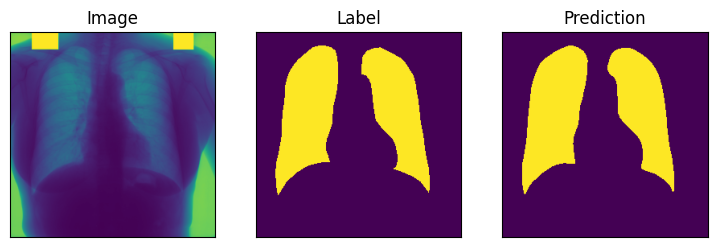

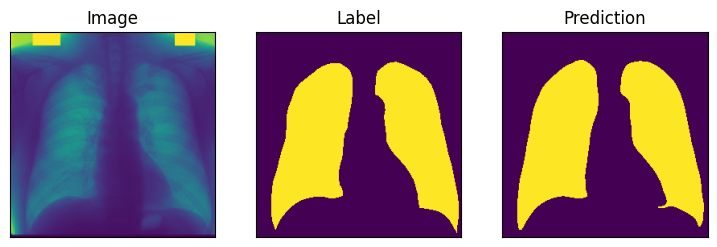

-------------------------------------------------------------------
[epoch 1], [test loss 0.0449 +/- 0.0156], [iou 0.9542 +/- 0.0128], [f1 0.9765 +/- 0.0068], [time 3.27]
-------------------------------------------------------------------


In [34]:
model_name = 'fcn_resnet'  # pode ser 'unet', 'fcn_resnet', 'swin', 'swins'
net = get_model_and_load_weights(model_name, args['n_classes'], args['device'])
test(test_loader, net, criterion, 1)

/tmp/ipykernel_162197/171110301.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(weights_path, map_location=device)


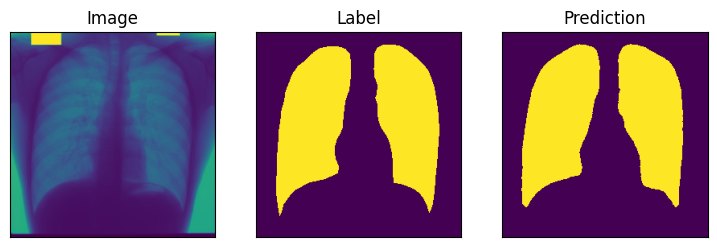

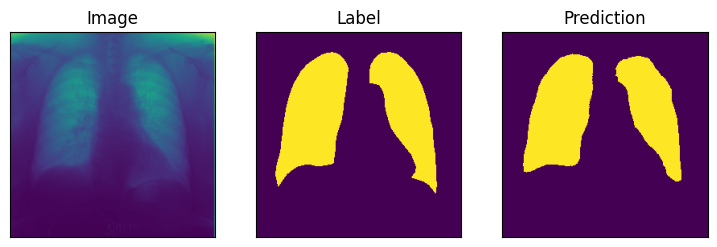

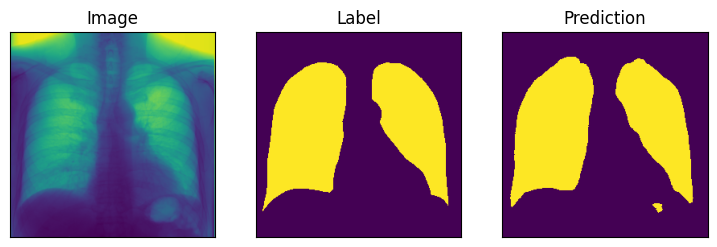

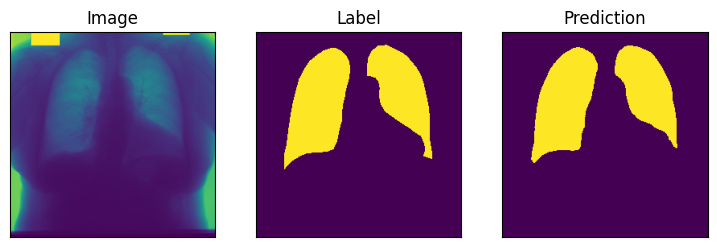

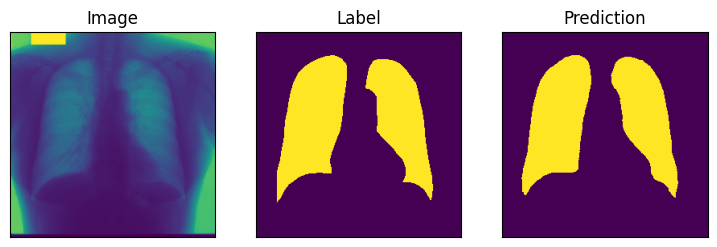

...

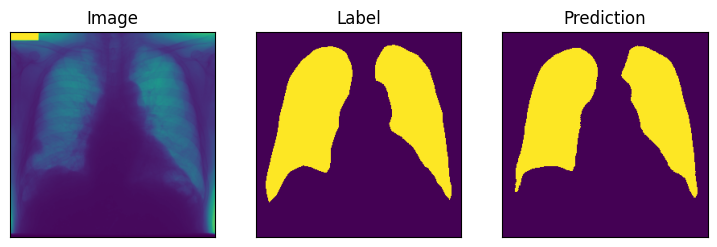

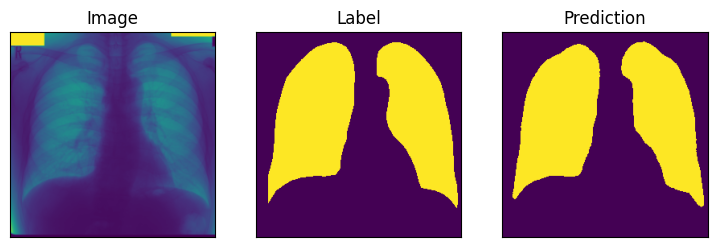

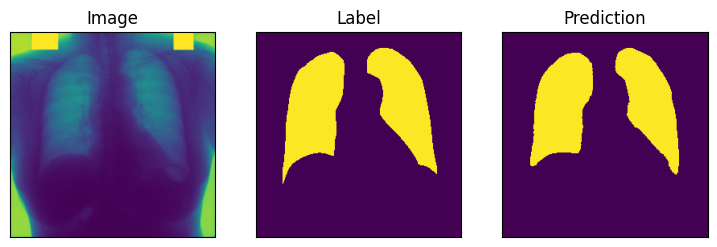

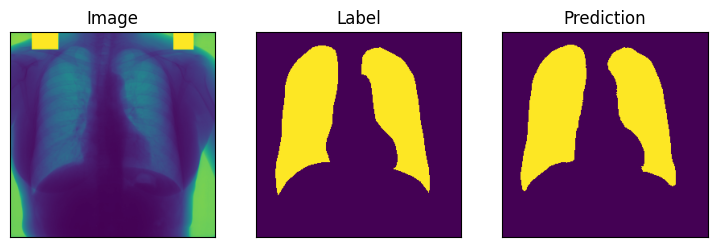

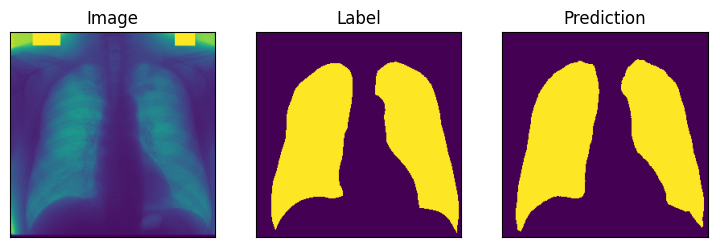

-------------------------------------------------------------------
[epoch 1], [test loss 0.0483 +/- 0.0107], [iou 0.9348 +/- 0.0160], [f1 0.9663 +/- 0.0086], [time 3.30]
-------------------------------------------------------------------


In [35]:
model_name = 'swin'  # pode ser 'unet', 'fcn_resnet', 'swin', 'swins'
net = get_model_and_load_weights(model_name, args['n_classes'], args['device'])
test(test_loader, net, criterion, 1)

/tmp/ipykernel_162197/171110301.py:27: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(weights_path, map_location=device)


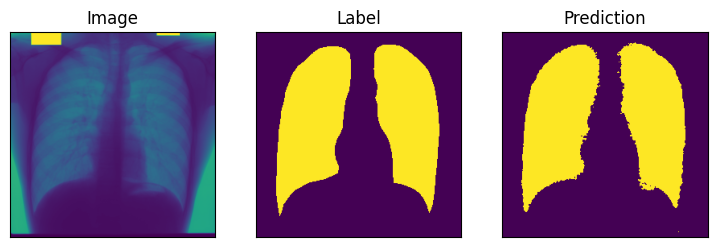

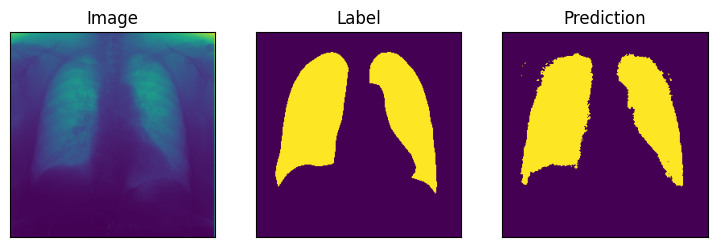

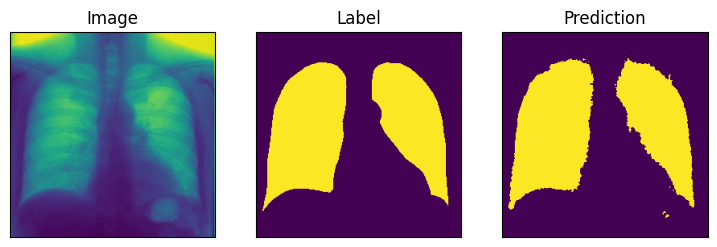

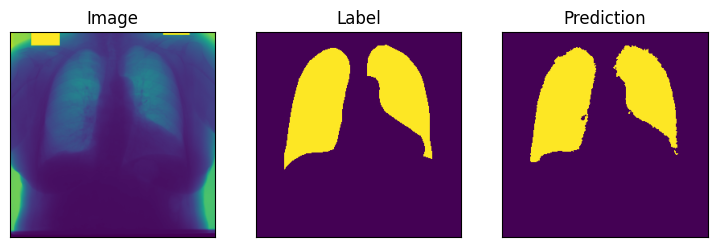

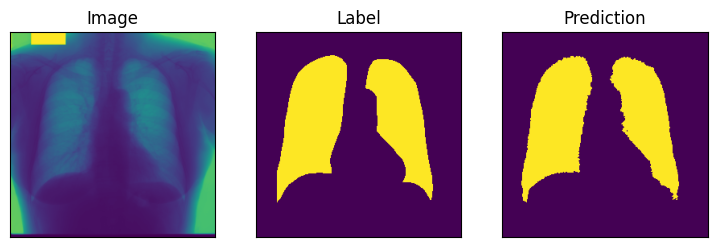

...

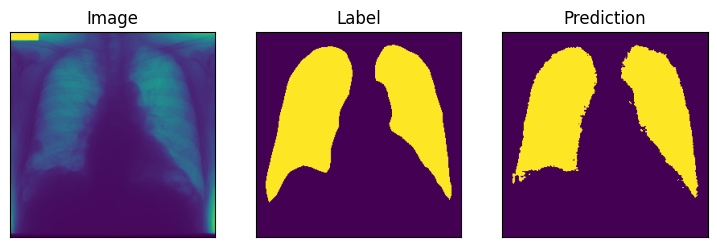

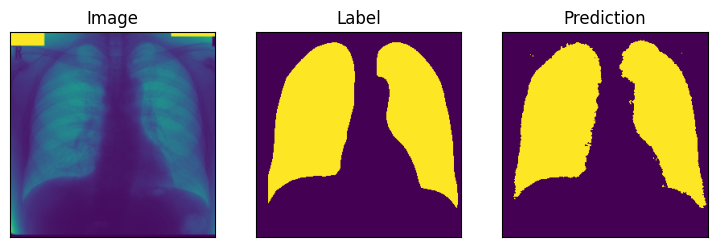

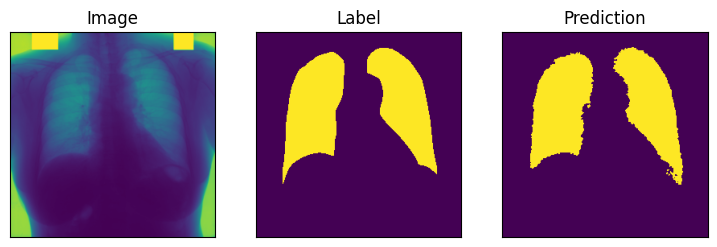

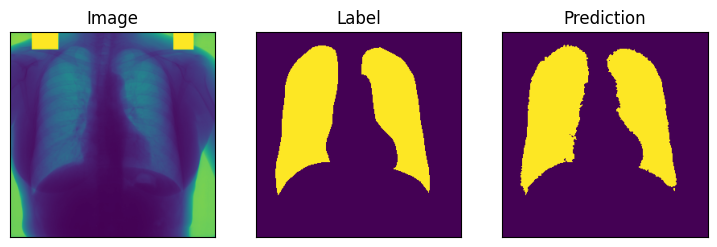

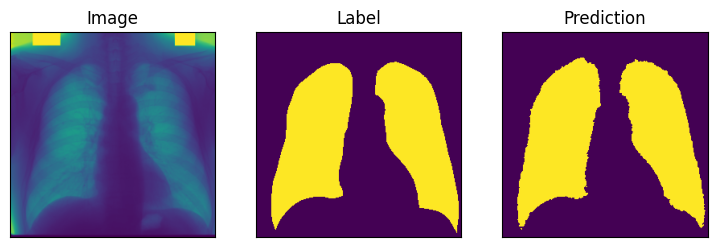

-------------------------------------------------------------------
[epoch 1], [test loss 0.0443 +/- 0.0098], [iou 0.9434 +/- 0.0138], [f1 0.9708 +/- 0.0074], [time 3.43]
-------------------------------------------------------------------


In [36]:
model_name = 'swins'  # pode ser 'unet', 'fcn_resnet', 'swin', 'swins'
net = get_model_and_load_weights(model_name, args['n_classes'], args['device'])
test(test_loader, net, criterion, 1)